In [1]:
%matplotlib inline

import os
import numpy as np
import rasterio as rio
import geopandas as gpd
from cartopy.feature import ShapelyFeature
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
from shapely.ops import unary_union
from shapely.geometry.polygon import Polygon
import shapely
import matplotlib.patches as mpatches
import matplotlib.lines as mlines

In [2]:
plt.ion() # make the plotting interactive

# generate matplotlib handles to create a legend of the features we put in our map.
def generate_handles(labels, colors, edge='k', alpha=1):
    lc = len(colors)  # get the length of the color list
    handles = []
    for i in range(len(labels)):
        handles.append(mpatches.Rectangle((0, 0), 1, 1, facecolor=colors[i % lc], edgecolor=edge, alpha=alpha))
    return handles

# create a scale bar of length 20 km in the upper right corner of the map
# adapted this question: https://stackoverflow.com/q/32333870
# answered by SO user Siyh: https://stackoverflow.com/a/35705477
def scale_bar(ax, location=(0.92, 0.95)):
    x0, x1, y0, y1 = ax.get_extent()
    sbx = x0 + (x1 - x0) * location[0]
    sby = y0 + (y1 - y0) * location[1]

    ax.plot([sbx, sbx - 20000], [sby, sby], color='k', linewidth=9, transform=ax.projection)
    ax.plot([sbx, sbx - 10000], [sby, sby], color='k', linewidth=6, transform=ax.projection)
    ax.plot([sbx-10000, sbx - 20000], [sby, sby], color='w', linewidth=6, transform=ax.projection)

    ax.text(sbx, sby-4500, '20 km', transform=ax.projection, fontsize=8)
    ax.text(sbx-12500, sby-4500, '10 km', transform=ax.projection, fontsize=8)
    ax.text(sbx-24500, sby-4500, '0 km', transform=ax.projection, fontsize=8)

# load the outline of Northern Ireland for a backdrop
outline = gpd.read_file(os.path.abspath('ni_data_files/NI_outline.shp'))

In [3]:
towns = gpd.read_file(os.path.abspath('ni_data_files/Towns.shp'))
water = gpd.read_file(os.path.abspath('ni_data_files/Water.shp'))
rivers = gpd.read_file(os.path.abspath('ni_data_files/Rivers.shp'))
counties = gpd.read_file(os.path.abspath('ni_data_files/Counties.shp'))

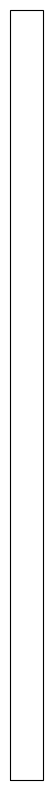

In [4]:
myFig = plt.figure(figsize=(10, 10))  # create a figure of size 10x10 (representing the page size in inches)

myCRS = ccrs.UTM(29)  # create a Universal Transverse Mercator reference system to transform the data, for the UTM Zone that Northern Ireland is part of

ax = plt.axes(projection=myCRS)  # create an axes object in the figure, using a UTM projection,

In [5]:
outline_feature = ShapelyFeature(outline['geometry'], myCRS, edgecolor='k', facecolor='w')
xmin, ymin, xmax, ymax = outline.total_bounds
ax.add_feature(outline_feature) # add the features created to the map.

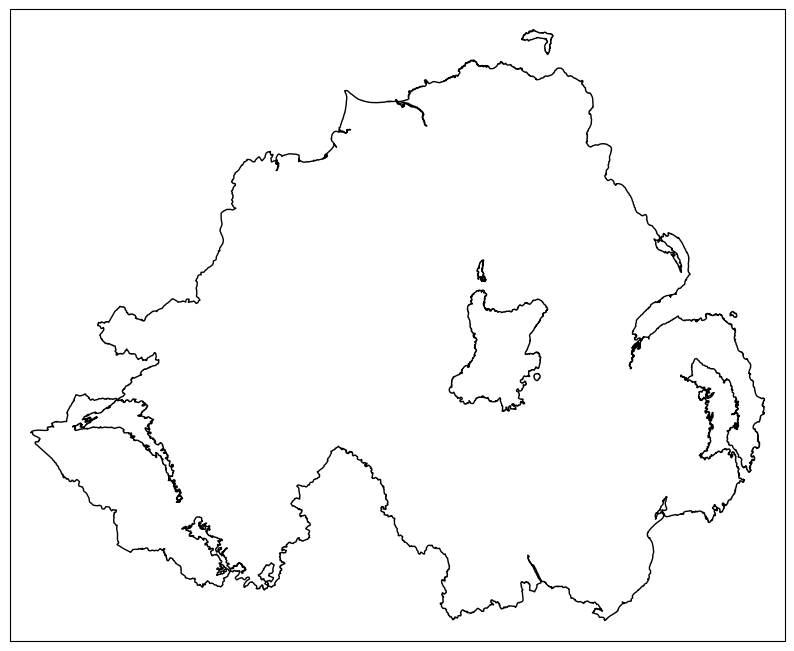

In [6]:
ax.set_extent([xmin-5000, xmax+5000, ymin-5000, ymax+5000], crs=myCRS) 

myFig 

In [7]:
num_counties = len(counties.CountyName.unique()) # get the number of unique municipalities we have in the dataset
print('Number of unique features: {}'.format(num_counties))

Number of unique features: 6


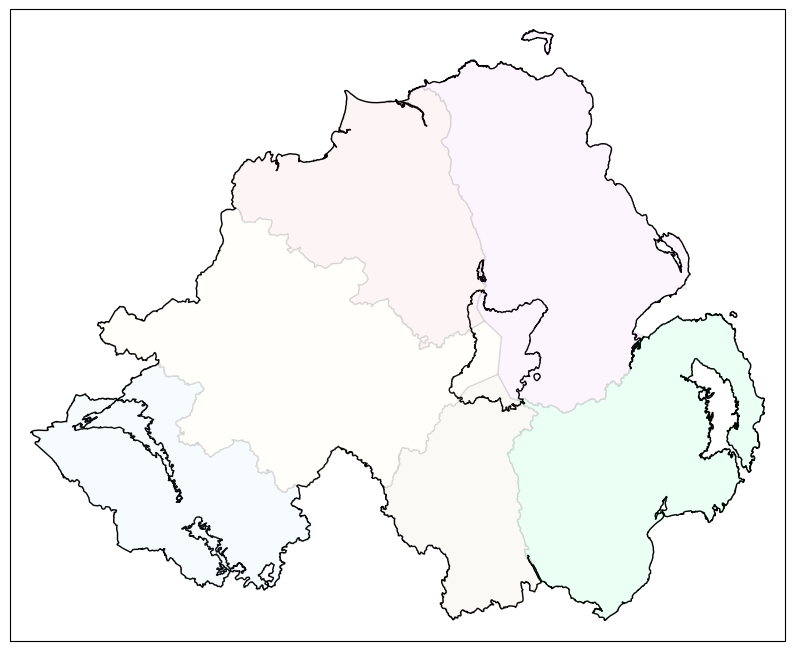

In [8]:
county_colors = ['violet', 'tan', 'springgreen', 'skyblue', 'lightcoral', 'lemonchiffon']
county_names = list(counties.CountyName.unique()) # get a list of unique names for the county boundaries
county_names.sort() # sort the counties alphabetically by name
for ii, name in enumerate(county_names):
    feat = ShapelyFeature(counties.loc[counties['CountyName'] == name, 'geometry'],
                          myCRS, # second argument is the CRS
                          edgecolor='k', # outline the feature in black
                          facecolor=county_colors[ii], # set the face color to the corresponding color from the list
                          linewidth=1, # set the outline width to be 1 pt
                          alpha=0.075) # set the alpha (transparency) to be 0.25 (out of 1)
    ax.add_feature(feat) # once we have created the feature, we have to add it to the map using ax.add_feature()

myFig # to show the updated figure        

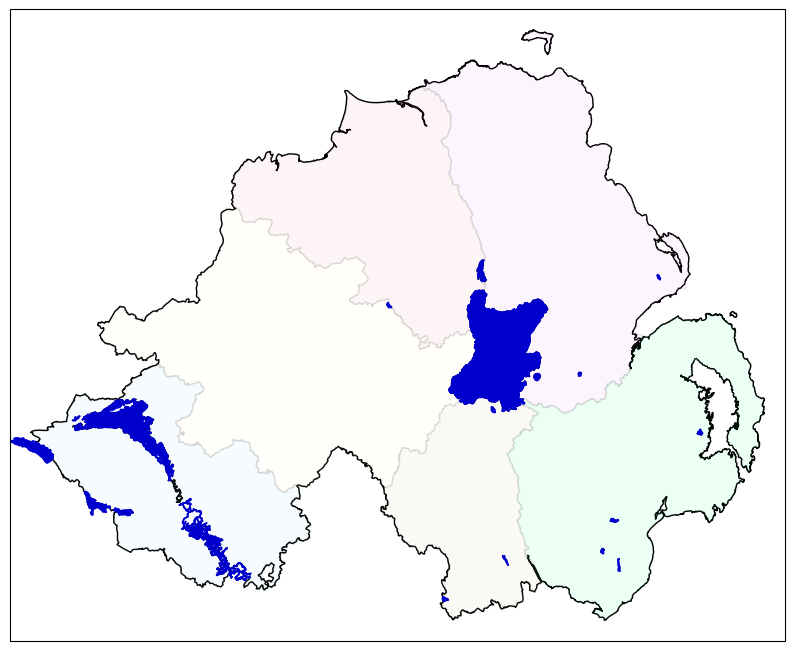

In [9]:
water_feat = ShapelyFeature(water['geometry'], # first argument is the geometry
                            myCRS, # second argument is the CRS
                            edgecolor='mediumblue', # set the edgecolor to be mediumblue
                            facecolor='mediumblue', # set the facecolor to be mediumblue
                            linewidth=1) # set the outline width to be 1 pt
ax.add_feature(water_feat) # add the collection of features to the map

myFig # to show the updated figure

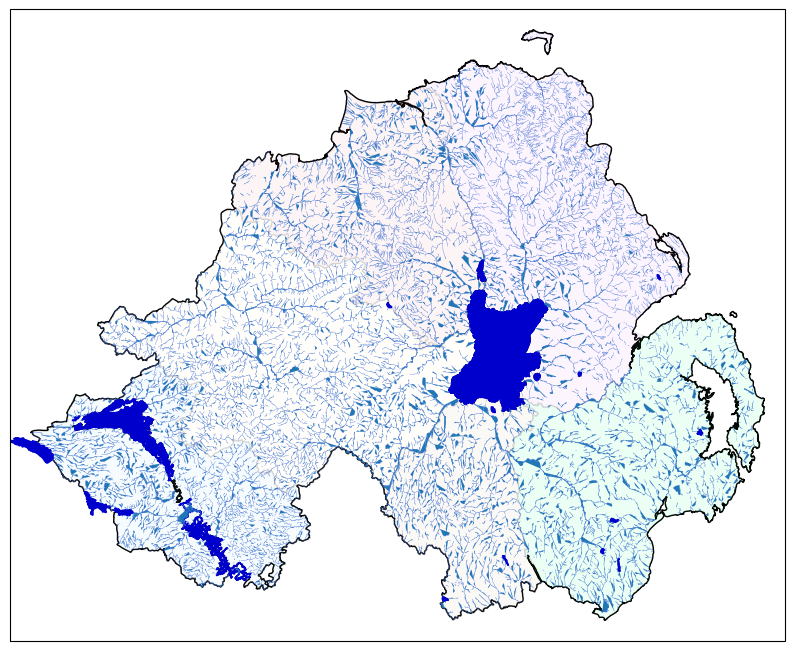

In [10]:
river_feat = ShapelyFeature(rivers['geometry'], # first argument is the geometry
                            myCRS, # second argument is the CRS
                            edgecolor='royalblue', # set the edgecolor to be royalblue
                            linewidth=0.2) # set the linewidth to be 0.2 pt
ax.add_feature(river_feat) # add the collection of features to the map

myFig # to show the updated figure

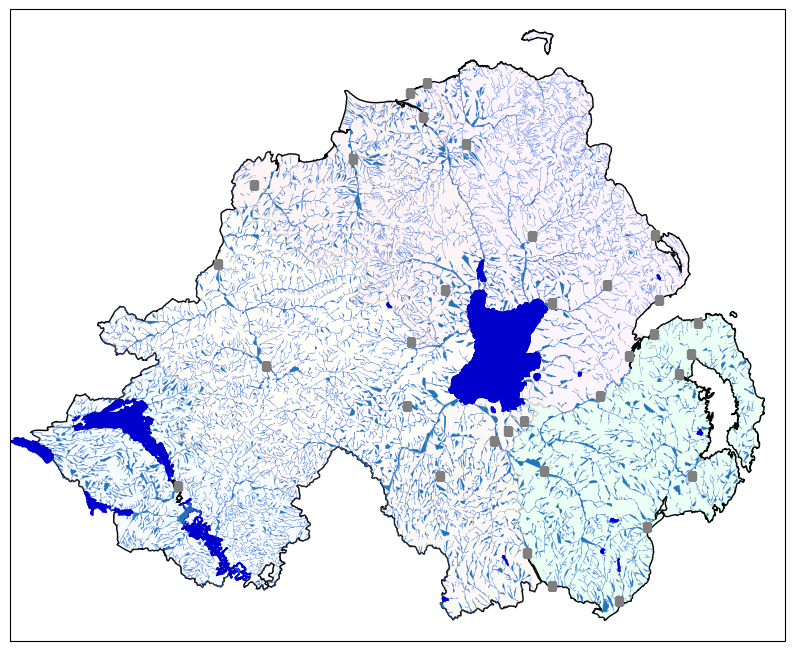

In [11]:
town_handle = ax.plot(towns.geometry.x, towns.geometry.y, 's', color='0.5', ms=6, transform=myCRS) # plots the x,y geometry of town locations and generates a handle for each town
county_handles = generate_handles(counties.CountyName.unique(), county_colors, alpha=0.25) # generates a handle for each unique county
water_handle = generate_handles(['Lakes'], ['mediumblue']) # generates a handle for the lakes in the dataset
river_handle = [mlines.Line2D([], [], color='royalblue')] # generates a handle for the rivers in the data set

myFig # to show the updated figure

In [12]:
nice_names = []  # initalize an empty list
for name in county_names:
    nice_names.append(name.title())

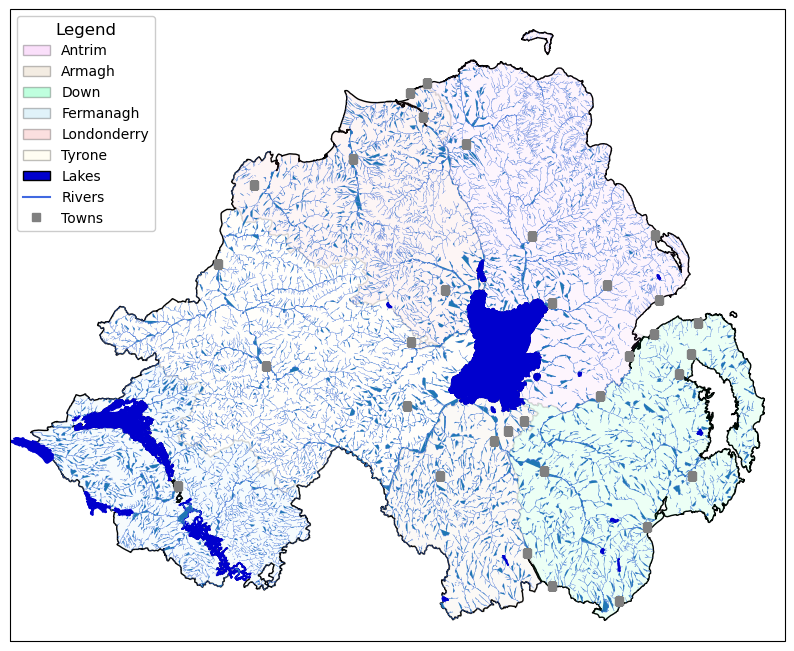

In [13]:
handles = county_handles + water_handle + river_handle + town_handle # concatenates handles produced previously
labels = nice_names + ['Lakes', 'Rivers', 'Towns'] # gives labels to the data

leg = ax.legend(handles, labels, title='Legend', title_fontsize=12,
                 fontsize=10, loc='upper left', frameon=True, framealpha=1) # generates a legend in the upper left corner

myFig # to show the updated figure

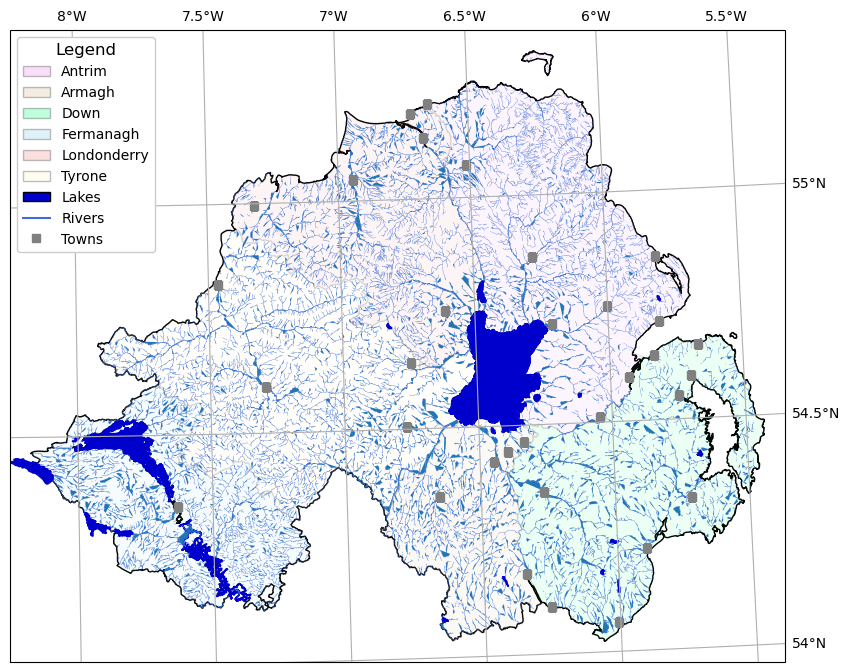

In [14]:
gridlines = ax.gridlines(draw_labels=True, # draw  labels for the grid lines
                         xlocs=[-8, -7.5, -7, -6.5, -6, -5.5], # add longitude lines at 0.5 deg intervals
                         ylocs=[54, 54.5, 55, 55.5]) # add latitude lines at 0.5 deg intervals
gridlines.left_labels = False # turn off the left-side labels
gridlines.bottom_labels = False # turn off the bottom labels

myFig # to show the updated figure

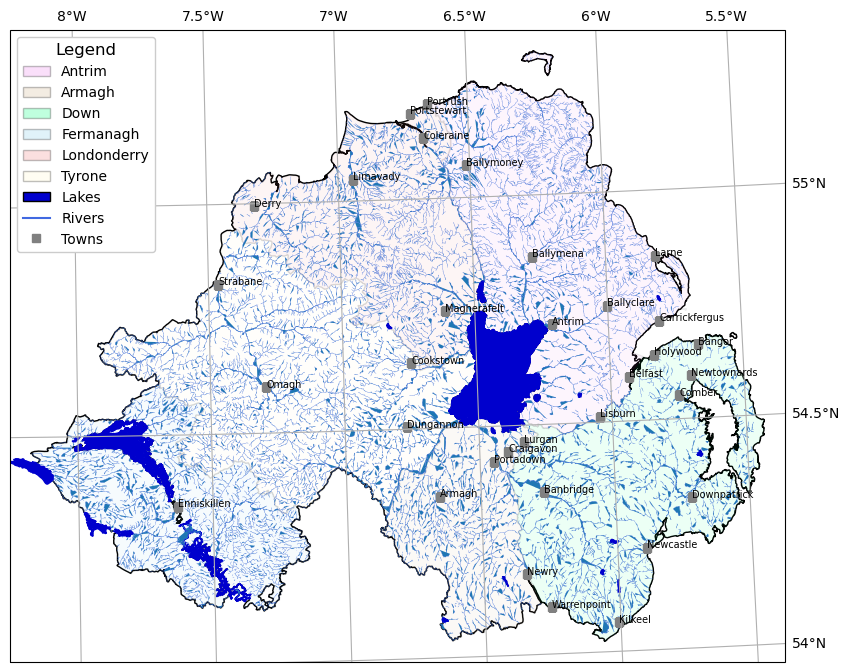

In [15]:
for ind, row in towns.iterrows(): # towns.iterrows() returns the index and row
    x, y = row.geometry.x, row.geometry.y # get the x,y location for each town
    ax.text(x, y, row['TOWN_NAME'].title(), fontsize=7, transform=myCRS) # use plt.text to place a label at x,y
   
myFig # to show the updated figure

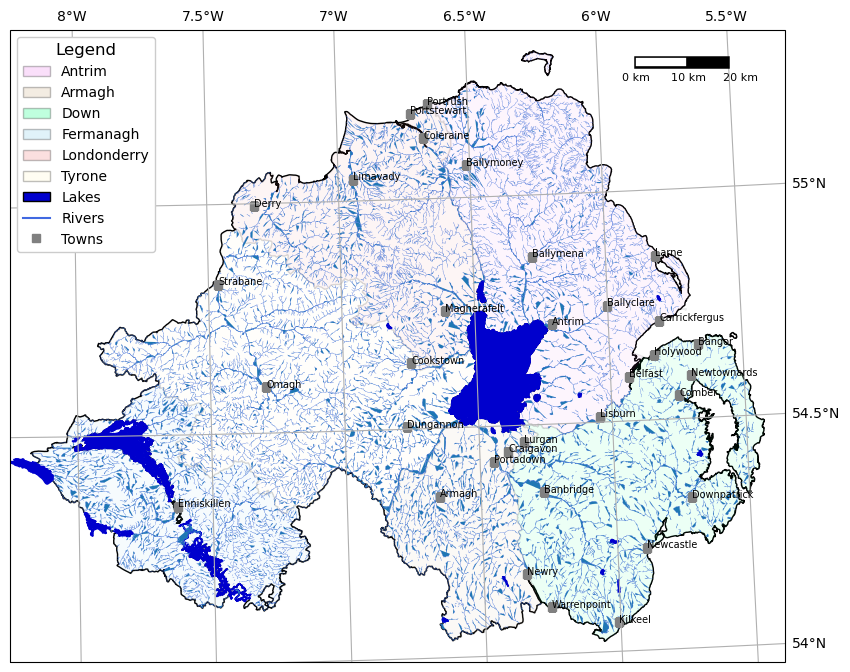

In [16]:
scale_bar(ax) # creates an appropriate scale bar

myFig # to show the updated figure

In [17]:
myFig.savefig('map.png', bbox_inches='tight', dpi=300)

In [18]:
dataset = rio.open('ni_data_files/NI_Mosaic.tif') # uses the rasterio module to open the data

print('{} opened in {} mode'.format(dataset.name,dataset.mode)) # prints the mode the data was opened in
print('image has {} band(s)'.format(dataset.count)) # prints the number of bands the opened raster has
print('image size (width, height): {} x {}'.format(dataset.width, dataset.height)) # prints the image in pixel height and width
print('band 1 dataype is {}'.format(dataset.dtypes[0])) # note that the band name (Band 1) differs from the list index [0]
print(dataset.bounds) # prints the bounding box of the data set
print(dataset.crs) # prints the crs for the dataset
print(dataset.transform) # prints the transformation matrix for the data set


ni_data_files/NI_Mosaic.tif opened in r mode
image has 7 band(s)
image size (width, height): 1850 x 1500
band 1 dataype is int16
BoundingBox(left=550000.0, bottom=5985000.0, right=735000.0, top=6135000.0)
EPSG:32629
| 100.00, 0.00, 550000.00|
| 0.00,-100.00, 6135000.00|
| 0.00, 0.00, 1.00|


In [19]:
img = dataset.read()

print(img.shape) # returns a tuple with the number of image bands bands, image height, and image width

print(img[0, dataset.height // 2, dataset.width // 2]) # note that // performs floor division, as indices have to be integers

centeri, centerj = dataset.height // 2, dataset.width // 2 # note that centeri corresponds to the row, and centerj the column
centerx, centery = dataset.transform * (centerj, centeri) # note the reversal here, from i,j to j,i

print(dataset.index(centerx, centery))

print((centeri, centerj) == dataset.index(centerx, centery)) # check that these are the same
top, lft = dataset.index(centerx-500, centery+500)
bot, rgt = dataset.index(centerx+500, centery-500)

subset = dataset.read(window=((top, bot), (lft, rgt))) # format is (top, bottom), (left, right)

dataset.close() # closes the dataset 

(7, 1500, 1850)
375
(750, 925)
True


In [20]:
with rio.open('ni_data_files/NI_Mosaic.tif') as dataset:
    img = dataset.read()
    xmin, ymin, xmax, ymax = dataset.bounds # assigns data set bounds
dataset

<closed DatasetReader name='ni_data_files/NI_Mosaic.tif' mode='r'>

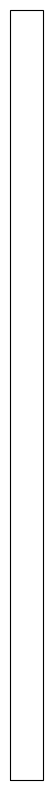

In [21]:
myCRS = ccrs.UTM(29) # note that this matches with the CRS of our image

fig, ax = plt.subplots(1, 1, figsize=(10, 10), subplot_kw=dict(projection=myCRS))

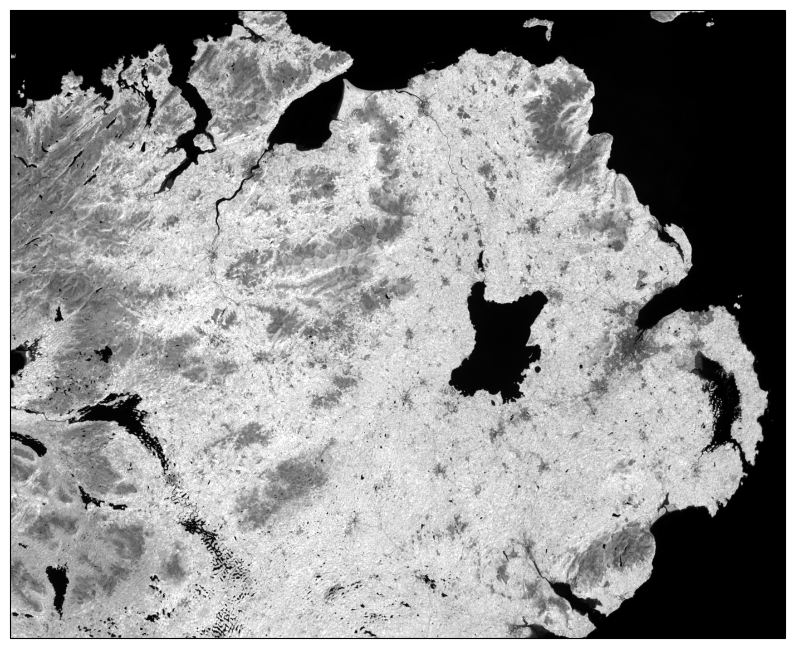

In [22]:
ax.imshow(img[3], cmap='gray', vmin=200, vmax=5000)

fig

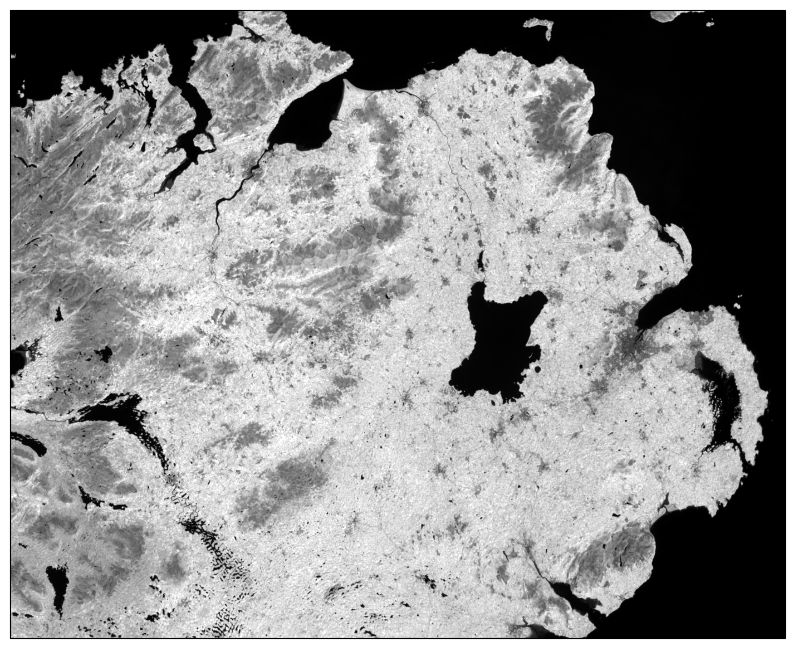

In [23]:
ax.imshow(img[3], cmap='gray', vmin=200, vmax=5000, transform=myCRS, extent=[xmin, xmax, ymin, ymax])

fig

In [24]:
def img_display(image, ax, bands, transform, extent):
  
    img_display == (img, ax, (0,1,2), myCRS, (xmin, ymin, xmax, ymax))

    # transposes the image to re-order the indices
    dispimg = image.transpose([1, 2, 0])
    
    # scales the image
    dispimg = dispimg / dispimg.max()
    
    # displays the image
    handle = ax.imshow(dispimg[:, :, bands], transform=transform, extent=extent)
    
    return handle, ax
maxvals = [img[i].max() for i in range(dataset.count)]
print(maxvals)

[2574, 3473, 4110, 6309, 8659, 3010, 6127]


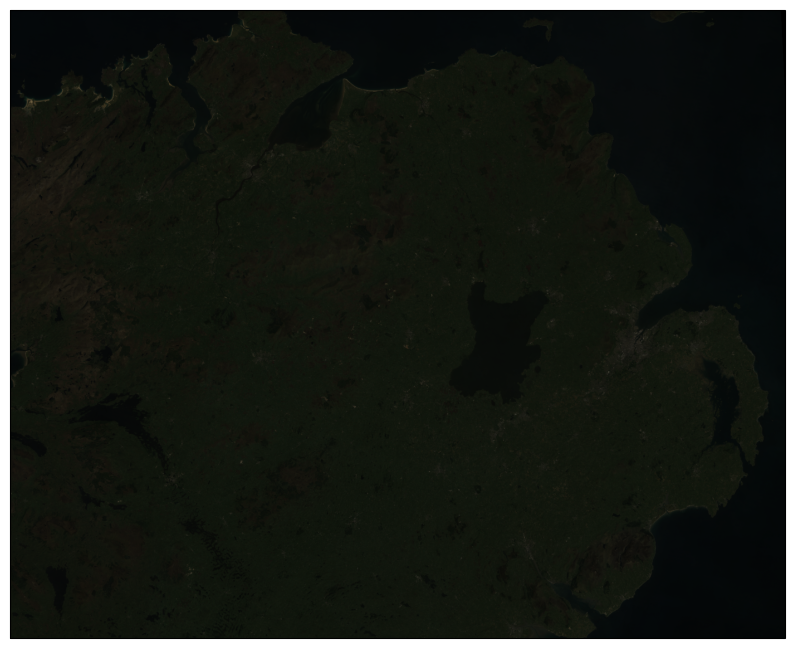

In [25]:
h, ax = img_display(img, ax, [2, 1, 0], myCRS, [xmin, xmax, ymin, ymax])
fig # re-displays the image


In [26]:
def percentile_stretch(image, pmin=0., pmax=100.):
  
    percentile_stretch == (img, pmin==0, pmax==100)

    # check that pmin < pmax, and that they are between 0 and 100
    if not 0 <= pmin < pmax <= 100:
        raise ValueError('0 <= pmin < pmax <= 100')
    # check that the image is only 2-dimensional
    if not image.ndim == 2:
        raise ValueError('Image can only have two dimensions (row, column)')
    
    minval = np.percentile(image, pmin)
    maxval = np.percentile(image, pmax)
    
    stretched = (image - minval) / (maxval - minval) # stretch the image to 0, 1
    stretched[image < minval] = 0 # set anything less than minval to the new minimum, 0.
    stretched[image > maxval] = 1 # set anything greater than maxval to the new maximum, 1.
    
    return stretched

In [27]:
def img_display_new(image, ax, bands, transform, extent, pmin=0, pmax=100):
 
    img_display_new == (img, ax, (0,1,2), myCRS, (xmin, ymin, xmax, ymax), pmin==0, pmax==100)

    dispimg = image.copy().astype(np.float32) # make a copy of the original image, casting it as a floating-point image, rather than an integer

    for b in range(image.shape[0]): # loop over each band, stretching using percentile_stretch()
        dispimg[b] = percentile_stretch(image[b], pmin=pmin, pmax=pmax)

    # transpose the image to re-order the indices
    dispimg = dispimg.transpose([1, 2, 0])
    
    # display the image
    handle = ax.imshow(dispimg[:, :, bands], transform=transform, extent=extent)
    
    return handle, ax

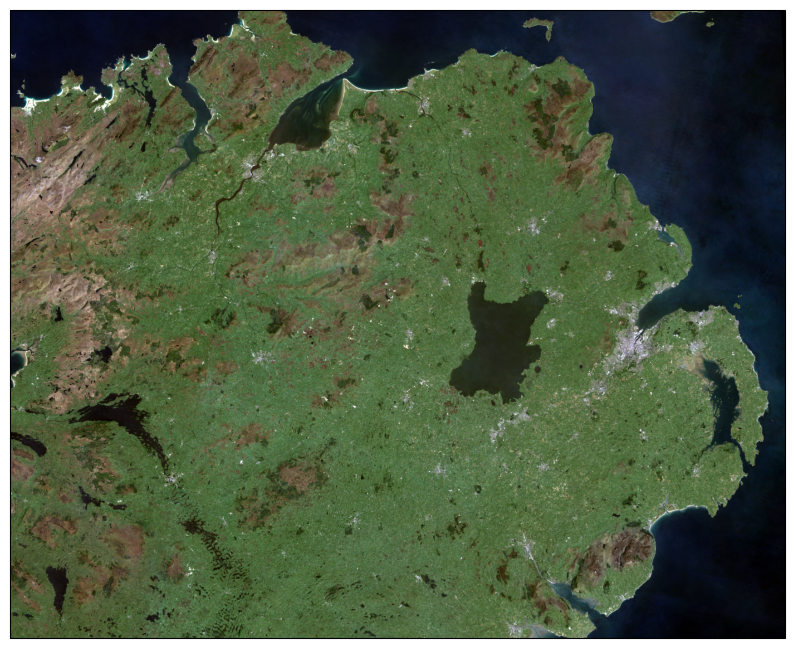

In [28]:
h, ax = img_display_new(img, ax, [2, 1, 0], myCRS, [xmin, xmax, ymin, ymax], pmin=0.1, pmax=99.9)
fig # just to save you from scrolling back up to see

In [29]:
def new_img_display(image, ax, bands, stretch_args=None, **imshow_args):
   
    new_img_display == (img, ax, (0,1,2), stretch_args==None, imshow_args)

    dispimg = image.copy().astype(np.float32) # make a copy of the original image,
    # but be sure to cast it as a floating-point image, rather than an integer

    for b in range(image.shape[0]): # loop over each band, stretching using percentile_stretch()
        if stretch_args is None: # if stretch_args is None, use the default values for percentile_stretch
            dispimg[b] = percentile_stretch(image[b])
        else:
            dispimg[b] = percentile_stretch(image[b], **stretch_args)

    # next, we transpose the image to re-order the indices
    dispimg = dispimg.transpose([1, 2, 0])
    
    # finally, we display the image
    handle = ax.imshow(dispimg[:, :, bands], **imshow_args)
    
    return handle, ax

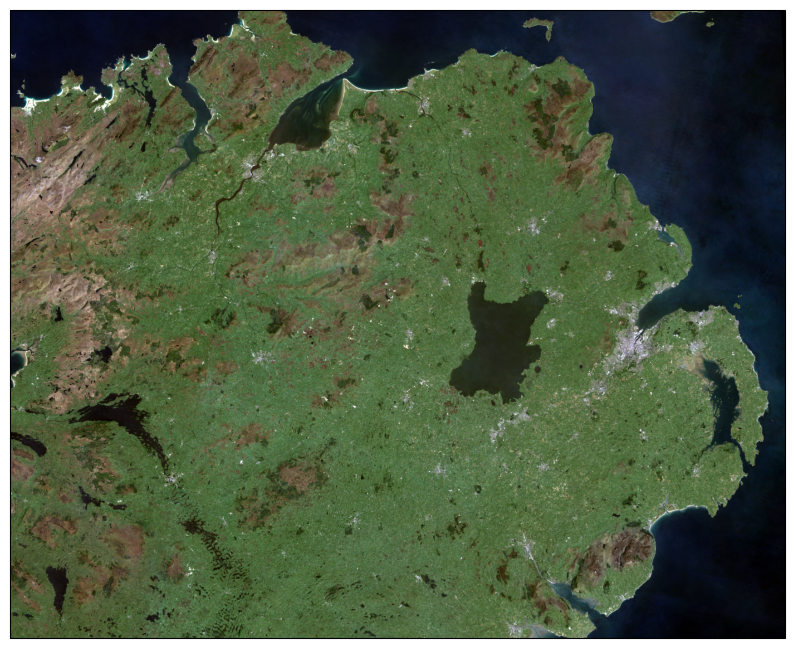

In [30]:
my_kwargs = {'extent': [xmin, xmax, ymin, ymax],
             'transform': myCRS}

my_stretch = {'pmin': 0.1, 'pmax': 99.9}

h, ax = new_img_display(img, ax, [2, 1, 0], stretch_args=my_stretch, **my_kwargs)

fig

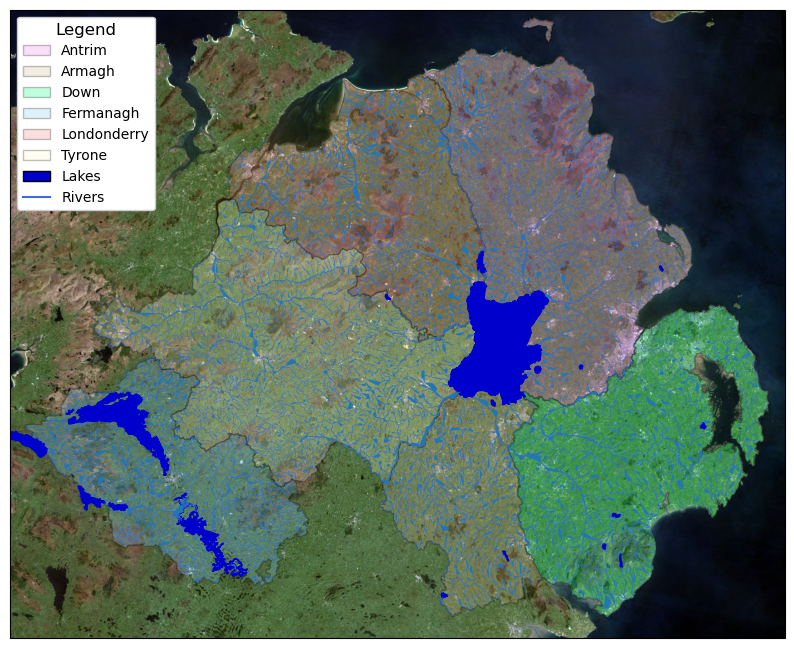

In [31]:

county_colors = ['violet', 'tan', 'springgreen', 'skyblue', 'lightcoral', 'lemonchiffon']
county_names = list(counties.CountyName.unique()) # get a list of unique names for the county boundaries
county_names.sort() # sort the counties alphabetically by name
for ii, name in enumerate(county_names):
    feat = ShapelyFeature(counties.loc[counties['CountyName'] == name, 'geometry'],
       myCRS, # second argument is the CRS
       edgecolor='k', # outline the feature in black
       facecolor=county_colors[ii], # set the face color to the corresponding color from the list
       linewidth=1, # set the outline width to be 1 pt
       alpha=0.25) # set the alpha (transparency) to be 0.25 (out of 1)
    ax.add_feature(feat) # once we have created the feature, we have to add it to the map using ax.add_feature()

ax.add_feature(water_feat) # add water features to the map
ax.add_feature(river_feat) # add river features to the map

county_handles = generate_handles(counties.CountyName.unique(), county_colors, alpha=0.25) # generates a handle for each unique county

nice_names = []  # initalize an empty list
for name in county_names:
    nice_names.append(name.title())

handles1 = county_handles + water_handle + river_handle # concatenates handles produced previously
labels = nice_names + ['Lakes', 'Rivers'] # gives labels to the data

leg = ax.legend(handles1, labels, title='Legend', title_fontsize=12,
                 fontsize=10, loc='upper left', frameon=True, framealpha=1) # generates a legend in the upper left corner


fig

In [32]:
fig.savefig('map.png', bbox_inches='tight', dpi=300)

In [ ]:
import rasterio.warp # note: we will be able to use rio.warp here, since we've previously imported rasterio as rio.
dst_crs = 'epsg:2157' # irish transverse mercator EPSG code

with rio.open('ni_data_files/NI_Mosaic.tif') as src:
    transform, width, height = rio.warp.calculate_default_transform(
            src.crs, dst_crs, src.width, src.height, *src.bounds)
    kwargs = src.meta.copy() # this copies the meta dict object
    kwargs.update({
        'crs': dst_crs,
        'transform': transform,
        'width': width,
        'height': height
    }) # note: to change the values in a dictionary, we use the update() method
    
    with rio.open('ni_data_files/NI_Mosaic_ITM.tif', 'w', **kwargs) as dst:
        for i in range(1, src.count + 1): # ranging from 1 to the number of bands + 1
            rio.warp.reproject(
                source=rio.band(src, i),
                destination=rio.band(dst, i),
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=dst_crs,
                resampling=rio.warp.Resampling.nearest)